In [102]:
import tensorflow as tf
from keras.layers import TextVectorization, Embedding, Conv1D, MaxPooling1D, Bidirectional, LSTM, Dense, Dropout
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import load_model
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
import json
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
pd.options.plotting.backend = "plotly"

print("Version: ", tf.__version__)
print("Eager mode: ", tf.executing_eagerly())
print("GPU is", "available" if tf.config.list_physical_devices("GPU") else "NOT AVAILABLE")

Version:  2.10.0
Eager mode:  True
GPU is available


In [103]:
df1 = pd.read_csv('./datasets/csv/Reddit_Data.csv')
df1['category'] = df1['category'].map({-1: -1.0, 0: 0.0, 1:1.0})
print(f'Number of reddit samples: {df1.shape[0]}')
df1.head()      # look at first 5 rows

Number of reddit samples: 37249


,clean_comment,category
0,family mormon have never tried explain them t...,1.0
1,buddhism has very much lot compatible with chr...,1.0
2,seriously don say thing first all they won get...,-1.0
3,what you have learned yours and only yours wha...,0.0
4,for your own benefit you may want read living ...,1.0


In [104]:
df2 = pd.read_csv('./datasets/csv/Twitter_Data.csv')
df2 = df2.rename(columns={'clean_text': 'clean_comment'})
print(f'Number of twitter samples: {df2.shape[0]}')
df2.head()

Number of twitter samples: 162980


,clean_comment,category
0,when modi promised “minimum government maximum...,-1.0
1,talk all the nonsense and continue all the dra...,0.0
2,what did just say vote for modi welcome bjp t...,1.0
3,asking his supporters prefix chowkidar their n...,1.0
4,answer who among these the most powerful world...,1.0


In [105]:
df = pd.concat([df1, df2], ignore_index=True)   # concatenate dataframes
df.isnull().sum()                               # show missing data

clean_comment    104
category           7
dtype: int64

In [106]:
comments_size = df['clean_comment'].memory_usage(deep=True) 
print("Comments memory usage : {:.2f} MiB".format(comments_size/2**20))

Comments memory usage : 40.46 MiB


In [107]:
df.dropna(axis=0, inplace=True)     # drop rows with missing data
size_before = df.size
df.drop_duplicates(inplace=True)    # drop duplicate rows
print(f'{size_before - df.size} duplicates dropped')
df['category'] = df['category'].map({-1.0:'Negative', 0.0:'Neutral', 1.0:'Positive'}) # map labels
print(f'{df.shape[0]} samples in total')

820 duplicates dropped
199708 samples in total


In [108]:
# calculate comment length (in words) and add column
df['length'] = df.clean_comment.str.split().apply(len)

# plot distribution of comment lengths
pd.Series(df.length).plot(kind='box')

In [109]:
# https://likegeeks.com/filtering-pandas-dataframe/ (comprehensive overview)

max_words = 200 # drop very long comments
min_words = 1   # drop empty comments
drop_comments_indices = df[(df.length > max_words) | (df.length < min_words)].index
print(
  f'Dropping {drop_comments_indices.size} comments with length not in [{min_words};{max_words}]'
)
df.drop(index=drop_comments_indices, inplace=True)

pd.Series(df.length).plot(kind='box')

#with pd.option_context('display.max_colwidth', None):
  #display(long_comments)


Dropping 608 comments with length not in [1;200]


In [110]:
mean = np.mean(df.length)
sample_mean_ratio = int(df.shape[0]/mean)
print(f"number of samples/mean length = {df.shape[0]}/{mean} = {sample_mean_ratio}")
# if sample_mean_ratio > 1500 use sequence model else use bag of words, reference:
# https://developers.google.com/machine-learning/guides/text-classification/step-2-5

number of samples/mean length = 199100/20.84756403817177 = 9550


In [111]:
df.drop(['length'], axis=1, inplace=True)
fig = px.pie(df, names='category', title='Category distribution')
fig.show()
# From the distribution below, a common sense baseline of 44% accuracy (always predicting positive) can be established
# Will try to beat that!

In [112]:

y = pd.get_dummies(df['category'])      # one-hot encode labels
y.head()                                # verify

,Negative,Neutral,Positive
0,0,0,1
1,0,0,1
2,1,0,0
3,0,1,0
4,0,0,1


In [113]:

input_ds = tf.data.Dataset.from_tensor_slices((df['clean_comment'], y)) # create input Dataset
print(list(input_ds.take(1)))   # verify

[(<tf.Tensor: shape=(), dtype=string, numpy=b' family mormon have never tried explain them they still stare puzzled from time time like some kind strange creature nonetheless they have come admire for the patience calmness equanimity acceptance and compassion have developed all the things buddhism teaches '>, <tf.Tensor: shape=(3,), dtype=uint8, numpy=array([0, 0, 1], dtype=uint8)>)]


In [114]:
ds_len = df.shape[0]                                    # number of rows in df
ds = input_ds.shuffle(buffer_size=ds_len, seed=1337)    # shuffle rows
# split input_ds
test_len = int(0.2*ds_len)                  # set test length to 20%
train_val_ds = ds.skip(test_len)            # 80% for training and validation
test_ds = ds.take(test_len)                 # 20% for testing

# split train_val_ds
val_len = int(0.25*(ds_len-test_len))
train_ds = train_val_ds.skip(val_len)       # 75% for training
val_ds = train_val_ds.take(val_len)         # 25% for validation

train_len = ds_len - val_len - test_len
print(
    f'Dataset split in {train_len} training samples, {val_len} validation samples and {test_len} test samples'
)

# batch
batch_size = 64
train_ds = train_ds.batch(batch_size=batch_size)
val_ds = val_ds.batch(batch_size=batch_size)
test_ds = test_ds.batch(batch_size=batch_size)

Dataset split in 119460 training samples, 39820 validation samples and 39820 test samples


In [115]:
# Define text vectorization layer to standardize, split, and map strings to integers

vocab_size = 20000          # vocabulary size
sequence_length = 60        # number of words to consider in each comment

vectorize_text = TextVectorization(
    split="whitespace",                     # split comment to words
    max_tokens=vocab_size,                  # maximum number of words to index
    ngrams=None,                            # use word level tokenization
    output_mode='int',                      # output word sequence vectors indexing vocabulary
    output_sequence_length=sequence_length  # pad/truncate to sequence length
)

X_train_ds = train_ds.map(lambda x, y: x)       # extract features
vectorize_text.adapt(X_train_ds)                # compute vocabulary

print(f'Top 100 words:\n{vectorize_text.get_vocabulary()[0:100]}\n')

2022-12-20 11:38:52.108476: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Top 100 words:
['', '[UNK]', 'modi', 'the', 'and', 'for', 'you', 'this', 'that', 'are', 'not', 'will', 'india', 'with', 'have', 'but', 'has', 'all', 'they', 'was', 'from', 'his', 'bjp', 'people', 'what', 'who', 'like', 'can', 'your', 'congress', 'now', 'only', 'about', 'why', 'our', 'one', 'narendra', 'just', 'its', 'their', 'how', 'govt', 'when', 'vote', 'more', 'him', 'there', 'country', 'should', 'time', 'even', 'any', 'dont', 'did', 'out', 'indian', 'which', 'years', 'good', 'also', 'election', 'get', 'them', 'then', 'modis', 'know', 'rahul', 'would', 'after', 'against', 'because', 'government', 'these', 'nation', 'than', 'had', 'been', 'want', 'see', 'think', 'some', 'same', 'power', 'again', 'party', 'give', 'were', 'other', 'make', 'gandhi', 'money', 'minister', 'said', 'hai', 'pakistan', 'done', 'very', 'say', 'says', 'every']



In [116]:
# save vocabulary for vectorization in javascript
# (tfjs is not compatible with TextVectorization layer)
with open( 'vocab.json' , 'w' ) as file:
    json.dump(vectorize_text.get_vocabulary(), file)

In [117]:
# look at mapping
batch = next(iter(X_train_ds.unbatch().batch(2)))

_ = list(
    map(lambda sample: print(
        f'Raw comment:\n{sample}\nVectorized comment:\n{vectorize_text(sample)}\n'
    ), batch)
)

Raw comment:
b'scam century modi goverment the 100th scam gujarat water supply and sewage board scam expenses worth rs340cr have not been listed per the accounting standards prescribed the institute chartered accountants india \xe2\x80\xa6 '
Vectorized comment:
[  467  2118     2  3716     3 10682   467   353   818  3532     4  7444
  2699   467  4138   923 16220    14    10    76  4926   252     3  9754
  2501 13849     3  3507  6527  8391    12   894     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0]

Raw comment:
b'will decide who wrong person upcoming electionon this critical condition had only person who drive our state with speedy development only proved last 5yrs but interested bringing yscrp into power because task allotted modi kcr'
Vectorized comment:
[   11  1003    25   249   204  1187     1     7  2146  2510    75    31
   204    25  2775    34   187    1

In [118]:
# standardize and encode strings to word sequence vectors efficiently,
# while training, utilizing a tf.data pipeline with autotuned parallelism
# Ref.: https://www.tensorflow.org/guide/data_performance
vectorized_train_ds = train_ds.map(lambda x, y: (vectorize_text(x), y), num_parallel_calls=tf.data.AUTOTUNE).cache()
vectorized_val_ds = val_ds.map(lambda x, y: (vectorize_text(x), y), num_parallel_calls=tf.data.AUTOTUNE).cache()
vectorized_test_ds = test_ds.map(lambda x, y: (vectorize_text(x), y), num_parallel_calls=tf.data.AUTOTUNE).cache()

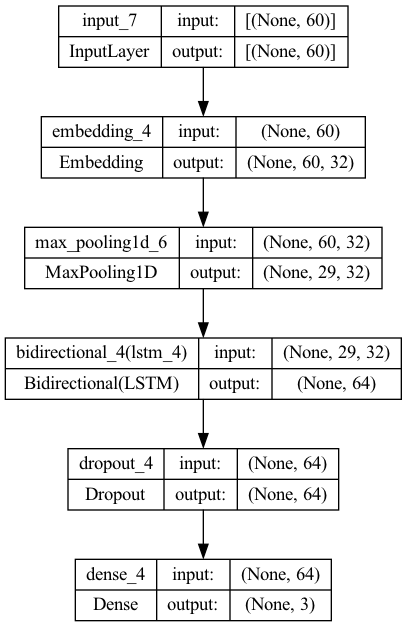

In [119]:
embedding_size = 32
epochs = 5

model = tf.keras.models.Sequential()
model.add(tf.keras.Input(shape=(sequence_length,)))

# The embedding layer maps each word index to vectors of embedding_size dimensions.
# The vectors are random at first, but is adjusted during training by backpropagation
# to make the geometric relationship of theese vectors reflect the semantic relationship between represented words.
# For example, the euclidian distance of vectors representing synonyms should be shorter after training,
# while the opposite should be true for vectors representing antonyms etc.
model.add(Embedding(vocab_size, embedding_size, input_length=sequence_length))
# params = vocab_size * embedding_size

# MaxPooling of embedding vectors (reducing sequence length)
model.add(MaxPooling1D(pool_size=4, strides=2))

# Two many to one LSTMs (one for each direction) returning last output.
# Hence the input sequence will be represented by a vector of size 64 after processing.
# params = 2 * 4 * [(numHiddenUnit + inputSize) * numHiddenUnits + numHiddenUnits]
model.add(Bidirectional(LSTM(32)))
# Under the hood, Bidirectional will copy the RNN layer passed in, and flip the go_backwards field of the newly copied layer, so that it will process the inputs in reverse order.
# The output of the Bidirectional RNN will be, by default, the concatenation of the forward layer output and the backward layer output. ref: https://www.tensorflow.org/guide/keras/rnn

model.add(Dropout(0.4))
model.add(Dense(3, activation='softmax'))

tf.keras.utils.plot_model(model, show_shapes=True)

In [120]:
print(model.summary())

model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.01), metrics=['accuracy'])

callbacks = [
        EarlyStopping(monitor='val_loss', patience=3),  # stop training early
        ModelCheckpoint(filepath='best_model.keras', monitor='val_loss', save_best_only=True)
]

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_4 (Embedding)     (None, 60, 32)            640000    
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 29, 32)           0         
 1D)                                                             
                                                                 
 bidirectional_4 (Bidirectio  (None, 64)               16640     
 nal)                                                            
                                                                 
 dropout_4 (Dropout)         (None, 64)                0         
                                                                 
 dense_4 (Dense)             (None, 3)                 195       
                                                                 
Total params: 656,835
Trainable params: 656,835
Non-tr

In [121]:
history = model.fit(
        vectorized_train_ds, 
        validation_data=vectorized_val_ds, 
        epochs=epochs, 
        callbacks=callbacks
)

Epoch 1/5


2022-12-20 11:38:57.073248: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2022-12-20 11:38:57.532851: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2022-12-20 11:38:57.554227: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2022-12-20 11:38:57.921145: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2022-12-20 11:38:57.946853: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1867/1867 [==============================] - ETA: 0s - loss: 0.2547 - accuracy: 0.9138

2022-12-20 11:40:34.848077: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2022-12-20 11:40:35.109578: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2022-12-20 11:40:35.122574: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1867/1867 [==============================] - 115s 60ms/step - loss: 0.2547 - accuracy: 0.9138 - val_loss: 0.1182 - val_accuracy: 0.9632
Epoch 2/5
1867/1867 [==============================] - 105s 56ms/step - loss: 0.1152 - accuracy: 0.9629 - val_loss: 0.1078 - val_accuracy: 0.9644
Epoch 3/5
1867/1867 [==============================] - 102s 55ms/step - loss: 0.0849 - accuracy: 0.9724 - val_loss: 0.1012 - val_accuracy: 0.9686
Epoch 4/5
1867/1867 [==============================] - 100s 54ms/step - loss: 0.0678 - accuracy: 0.9783 - val_loss: 0.1015 - val_accuracy: 0.9697
Epoch 5/5
1867/1867 [==============================] - 100s 53ms/step - loss: 0.0546 - accuracy: 0.9823 - val_loss: 0.0984 - val_accuracy: 0.9727


In [122]:
# Evaluate test dataset on best model
model = load_model('best_model.keras')    # Load best model

model.save('convert_js_model.h5') # this model can be converted (with tfjs) to a tfjs compatible model

loss, accuracy = model.evaluate(vectorized_test_ds, verbose=0)     
print('Accuracy  : {:.4f}'.format(accuracy))
print('Loss      : {:.4f}'.format(loss))

2022-12-20 11:47:39.473772: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2022-12-20 11:47:39.717185: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2022-12-20 11:47:39.728703: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Accuracy  : 0.9733
Loss      : 0.0980


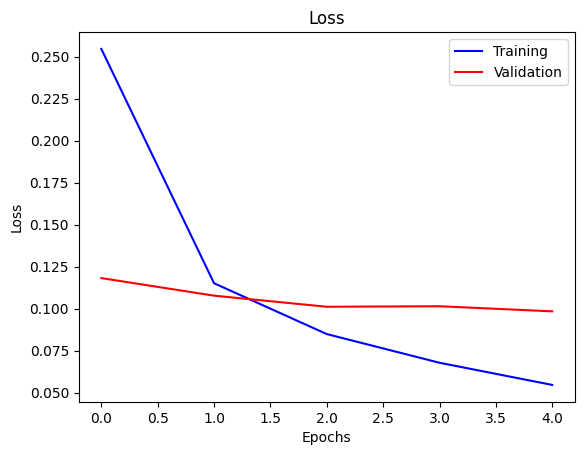

In [123]:
# plot training and validation loss
loss_values = history.history["loss"]
val_loss_values = history.history["val_loss"]
epochs = range(len(loss_values))
plt.plot(epochs, loss_values, "b", label="Training")
plt.plot(epochs, val_loss_values, "r", label="Validation")
plt.title("Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

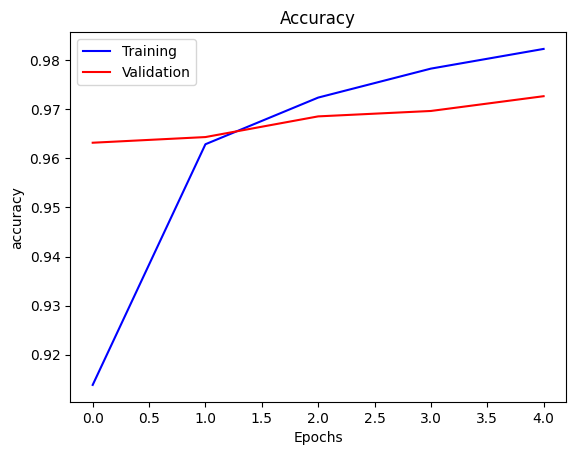

In [124]:
# plot training and validation accuracy
acc_values = history.history["accuracy"]
val_acc_values = history.history["val_accuracy"]
plt.plot(epochs, acc_values, "b", label="Training")
plt.plot(epochs, val_acc_values, "r", label="Validation")
plt.title("Accuracy")
plt.xlabel("Epochs")
plt.ylabel("accuracy")
plt.legend()
plt.show()

2022-12-20 11:47:57.261738: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2022-12-20 11:47:57.353628: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2022-12-20 11:47:57.368729: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


623/623 [==============================] - 8s 13ms/step
(39820, 3) 39820


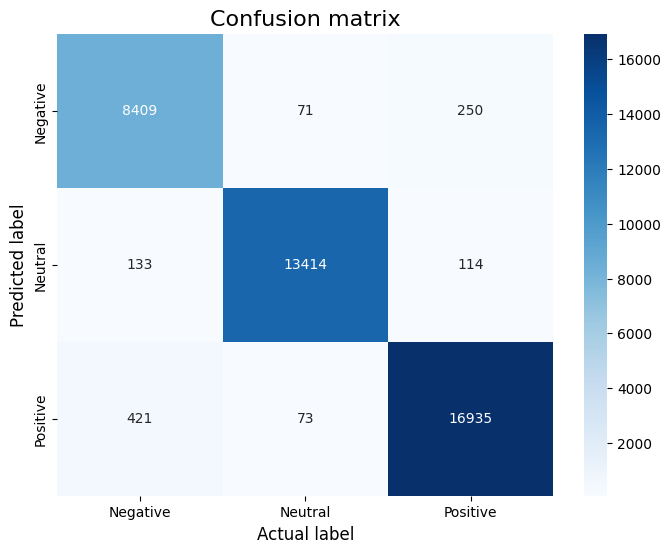

In [125]:
def plot_confusion_matrix(model, test_ds):
    sentiment_classes = ['Negative', 'Neutral', 'Positive']
    y_pred = model.predict(test_ds)
    y_true = [y for y in test_ds.unbatch().map(lambda x, y: y)]
    print(y_pred.shape, len(y_true))
    cm = confusion_matrix(np.argmax(y_true, axis=1), np.argmax(y_pred, axis=1))
    
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, cmap=plt.cm.Blues, annot=True, fmt='d', 
                 xticklabels=sentiment_classes,
                 yticklabels=sentiment_classes)
    plt.title('Confusion matrix', fontsize=16)
    plt.xlabel('Actual label', fontsize=12)
    plt.ylabel('Predicted label', fontsize=12)

plot_confusion_matrix(model, vectorized_test_ds)

In [126]:
# create complete model (include vectorization) to accept raw variable length text input
inputs = tf.keras.Input(shape=(1,), dtype="string")
vectorized_inputs = vectorize_text(inputs)
outputs = model(vectorized_inputs)
final_model = tf.keras.Model(inputs, outputs)
final_model.save("final_best_model") # currently this model is not convertable to tfjs, but works with python tf

INFO:tensorflow:Assets written to: final_best_model/assets


INFO:tensorflow:Assets written to: final_best_model/assets


In [127]:
def infer_sentiment(sentences):
    if not sentences:
        print("list was empty", sentences)
    sentiment_classes = ['Negative', 'Neutral', 'Positive']
    for i, output in enumerate(final_model.predict(sentences)):
        index = output.argmax()
        print(f"'{sentences[i]}'\n--> {sentiment_classes[index].upper()} : " + "{:.4f}".format(output[index]))

comments = [
    "I love you",
    "I hate you",
    "I dont care",
    "worst of all",
    "be careful next time", 
    "you are negative", 
    "piece of shit"
]
infer_sentiment(comments)

2022-12-20 11:48:23.022007: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2022-12-20 11:48:23.130889: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2022-12-20 11:48:23.143309: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 603ms/step
'I love you'
--> POSITIVE : 0.9997
'I hate you'
--> NEGATIVE : 0.9999
'I dont care'
--> NEUTRAL : 0.9989
'worst of all'
--> NEGATIVE : 0.9989
'be careful next time'
--> NEGATIVE : 0.9189
'you are negative'
--> NEGATIVE : 0.9999
'piece of shit'
--> NEGATIVE : 0.9982


In [128]:
# Fetch comments from reddit API
import os
from dotenv import load_dotenv
import praw
from praw.models import MoreComments

load_dotenv("./reddit.env") # load credentials from .env file
USER_AGENT, CLIENT_ID, CLIENT_SECRET = os.getenv('USER_AGENT'), os.getenv('CLIENT_ID'), os.getenv('CLIENT_SECRET')
reddit = praw.Reddit(user_agent=USER_AGENT, client_id=CLIENT_ID, client_secret=CLIENT_SECRET)

# retrieve comments by submission url or object
def fetch_reddit_comments(url=None, submission=None):
    if not submission and not url:
        return
    elif not submission:  # use url
        submission = reddit.submission(url=url)
    return [
        comment.body for comment in list(submission.comments)
        if not isinstance(comment, MoreComments) and comment.body != "[deleted]"
    ]

In [129]:
random_submission = reddit.subreddit('all').random()
comments = fetch_reddit_comments(submission=random_submission)
if comments:
    infer_sentiment(comments)

2/2 [==============================] - 0s 193ms/step
'I feel like more people need to acknowledge that planned parenthood establishments do more than just abortions. They provide other services that are very important to women's Healthcare.'
--> POSITIVE : 0.9999
'600,000 dead* babies. That makes the debate an easy slam dunk.'
--> NEGATIVE : 0.4411
'Especially when 600000 babies aren’t actually babies..'
--> NEUTRAL : 0.9919
'Love how the same people who cry about abortion are the same ones opposed to any policies that benefits mothers, families, and the kids they cry about.'
--> POSITIVE : 0.9995
'I grew up I  catholic schools for 16 years since before elementary school, I learned that god is everywhere so why these people need a church to pray? To learn how to behave? If you are a true believer, you understand your soul is link to a higher energy, not a priest preaching to you.'
--> POSITIVE : 0.9987
'He’s not lying tho is he'
--> NEUTRAL : 0.9999
'Yet we never hear how natural child

In [130]:
positive_comments_url = "https://www.reddit.com/r/UpliftingNews/comments/ytmvv3/man_donates_18k_worth_of_selfcare_items_to_118/"
infer_sentiment(fetch_reddit_comments(positive_comments_url))

1/1 [==============================] - 0s 171ms/step
'Reminder: this subreddit is meant to be a place free of excessive cynicism, negativity and bitterness. Toxic attitudes are not welcome here.  

All Negative comments will be removed and will possibly result in a ban.
---
---

*I am a bot, and this action was performed automatically. Please [contact the moderators of this subreddit](/message/compose/?to=/r/UpliftingNews) if you have any questions or concerns.*'
--> POSITIVE : 0.9980
'Phenomenal job. Very impressive. Wonderful.'
--> POSITIVE : 1.0000
'Animal rescue work can be absolutely *soul crushing* at times, and you will see things you can’t un-see.  Veterinary medicine is even worse.

Good for this guy for making the workers’ days a little easier.'
--> POSITIVE : 1.0000
'Did you know that in the US, shelter employees have a higher than average rate of [dying by suicide](https://post.bark.co/fun/compassion-fatigue-animal-workers/)?

> A recent study by the American Journal of Pre